In [13]:
#En esta primera celda importaremos todas las librerías necesárias para el trabajo
import os
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Apartado 1: 
### A) Lee las imágenes y muéstralas en pantalla. También se deberán convertir a escala de grises.
- En este apartado cargaremos las imágenes de las frutas que tenemos, en nuestro caso serán manzanas rojas y verdes, plátanos, kiwis y naranjas. Todas estas imágenes están nombradas y almacenadas en una carpeta.  
- Seguidamente las mostraremos por pantalla y las convertiremos a una escala de grises para trabajar con ellas. Este último apartado es esencial para reducir la complejidad de la imagen y facilitar la extracción de características visuales.

In [14]:
#Creamos dos listas en las que guardaremos las imagenes y sus respecivas etiquetas, las cuales encontraremos en el título o nombre de archivo de cada imagen.
imagenes = []
etiquetas = []

#Asignamos la ruta donde se encuentran nuestras imágenes
ruta_base = r"C:\\Users\\Felix\\Desktop\\imagenes"

#Configuración de clases de frutas y cuántas imágenes tiene cada una.
frutas_info = {
    "platano": 30,   
    "naranja": 30,   
    "kiwi": 22,
    "manzana": 60,      
}

#Creamos un bucle en el que recorremos cada tipo de fruta, asignandola a la lista de imagenes y a la lista de etiquetas correspondiente.
for fruta, cantidad in frutas_info.items():
    for i in range(1, cantidad + 1):
        nombre_archivo = f"{fruta}{i}.png"
        ruta_completa = os.path.join(ruta_base, nombre_archivo)

        img_color = cv2.imread(ruta_completa)
        if img_color is not None:
            img_rgb = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
            img_rgb = cv2.resize(img_rgb, (300, 300))
            imagenes.append(img_rgb)
            etiquetas.append(fruta)
        else:
            print(f"Imagen no encontrada: {ruta_completa}")

#Convertimos a arrays las listas
imagenes = np.array(imagenes)
etiquetas = np.array(etiquetas)

print("Total de imágenes cargadas:", len(imagenes))
print("Clases encontradas:", np.unique(etiquetas))


Total de imágenes cargadas: 142
Clases encontradas: ['kiwi' 'manzana' 'naranja' 'platano']


In [15]:
#Creamos un dataset con las dos listas que hemos creado anteriormente
dataset = list(zip(imagenes, etiquetas))

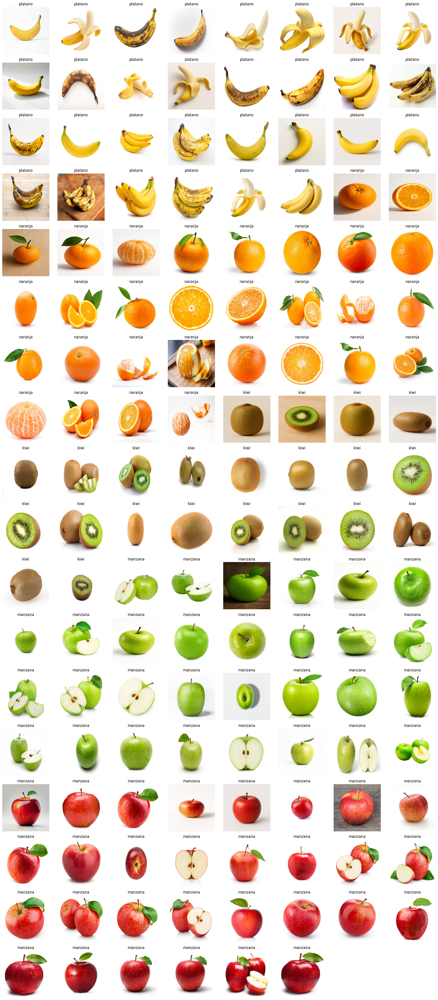

In [16]:
#Mostramos todas las imágenes que hemos procesado y guardado en el dataset en una sola figura.
plt.figure(figsize=(20, 45))
for i in range(142):
    img, label = dataset[i]
    plt.subplot(18, 8, i + 1)
    plt.imshow(img)
    plt.title(label, fontsize=12)
    plt.axis('off')

plt.tight_layout()
plt.show()


Podemos visualizar que cada clase de fruta tiene imágenes de todo tipo, de la fruta en diferentes ángulos, varias piezas de fruta y la fruta cortada o abierta.

In [17]:
#Ahora convertiremos todas las imágenes a escala de grises, para eso repetimos el proceso anterior creando un nuevo dataset que guarde las iágenes grieses.
imagenes_gris = []
etiquetas_gris = []

#Iteramos sobre cada pareja (imagen, etiqueta) y convertimos de RGB a escala de grises
for img_rgb, label in dataset:
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    imagenes_gris.append(img_gray)
    etiquetas_gris.append(label)

#Creamos el dataset en gris
dataset_gris = list(zip(imagenes_gris, etiquetas_gris))

print("Total de imágenes en gris:", len(imagenes_gris))
print("Clases en gris:", set(etiquetas_gris))

Total de imágenes en gris: 142
Clases en gris: {np.str_('manzana'), np.str_('naranja'), np.str_('kiwi'), np.str_('platano')}


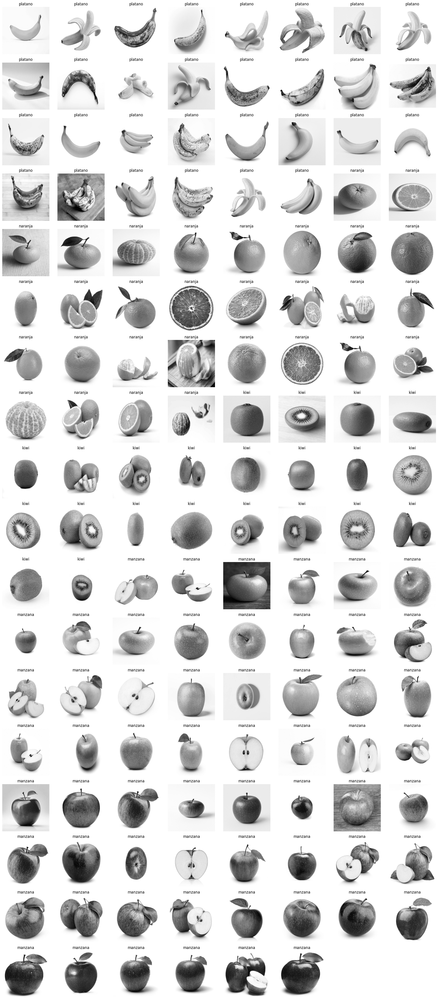

In [18]:
#Volvemos a mostrar las mismas imágenes para combrobar que funciona pero esta vez en blanco y negro.
plt.figure(figsize=(20, 45))
for i in range(142):
    img_gray, label = dataset_gris[i]
    plt.subplot(18, 8, i + 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title(label, fontsize=12)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Apartado 2:
### B) Utiliza Python y OpenCV para extraer características básicas de las imágenes en escala de grises, como la media y desviación estándar de la intensidad de píxeles. 
### ¿Por qué es importante la extracción de características en el reconocimiento de patrones?
- En este apartado extraeremos las características estadísticas simples, como la media y desviación estándar, de las imágenes en escala de grises procesadas anteriormente.
- Estas características servirán como entrada para los modelos de aprendizaje automático que usaremos después.

In [26]:
#Extraemos media, desviación y mediana de intensidad por cada imagen
media_intensidad = []
desviacion_intensidad = []
mediana_intensidad = []
clases = []

for img_gray, label in dataset_gris:
    media = np.mean(img_gray)
    std = np.std(img_gray)
    mediana = np.median(img_gray)

    media_intensidad.append(media)
    desviacion_intensidad.append(std)
    mediana_intensidad.append(mediana)
    clases.append(label)

#Creamos el DataFrame de características
df_caracteristicas = pd.DataFrame({
    'media_intensidad': media_intensidad,
    'desviacion_intensidad': desviacion_intensidad,
    'mediana_intensidad': mediana_intensidad,
    'clase': clases
})

# #Convertimos a array de NumPy
X = np.array(df_caracteristicas)  #Matriz de características
y = np.array(clases)  #Vector de etiquetas

# #Observamos la forma
print("Matriz de características (X) shape:", X.shape)
print("Vector de etiquetas (y) shape:", y.shape)

#Mostramos las primeras y últimas filas (caraterísticas de cada imagen)
print("Tabla de características extraídas:")
print(df_caracteristicas.head())
print(df_caracteristicas.tail())

Matriz de características (X) shape: (142, 4)
Vector de etiquetas (y) shape: (142,)
Tabla de características extraídas:
   media_intensidad  desviacion_intensidad  mediana_intensidad    clase
0        240.624200              22.364479               251.0  platano
1        237.737711              29.509605               255.0  platano
2        215.172922              65.246600               255.0  platano
3        222.376767              45.011175               241.0  platano
4        233.758989              35.065615               255.0  platano
     media_intensidad  desviacion_intensidad  mediana_intensidad    clase
137        182.596867              88.929230               255.0  manzana
138        188.563389              82.172354               253.0  manzana
139        189.198600              83.254931               255.0  manzana
140        172.871433              87.492909               226.0  manzana
141        154.639867              91.469347               139.0  manzana


## ¿Por qué es importante la extracción de características en el reconocimiento de patrones?
- La extracción de características es esencial en el reconocimiento de patrones porque nos permite reducir la complejidad de los datos originales (imágenes) a un conjunto manejable de valores numéricos representativos. 
- En vez de trabajar con todos los píxeles de la imagen, que pueden ser miles y miles, extraemos solo la información más relevante para la clasificación.
- Estas características que buscamos, como la media. desviación y mediana, ayudan a los modelos a encontrar relaciones numéricas entre imágenes de la misma clase solo teniendo en cuenta los valores.

# Apartado 3: 
### C) Entrena un clasificador SVM en Python con Scikit-Learn utilizando las características extraídas (media y desviación estándar de intensidad) para clasificar las imágenes.
- En esta sección se entrenará un modelo de clasificación SVM (Máquinas de Vectores de Soporte) usando las características extraídas y así predecir a qué clase pertenece cada imagen.

In [21]:
#Seleccionamos solo las columnas de características
X = df_caracteristicas[['media_intensidad', 'desviacion_intensidad', 'mediana_intensidad']]
y = df_caracteristicas['clase']

#Dividimos el dataset (modificable según el caso, en este caso usaremos 40% datos de entrenamiento y 60% de prueba), sinó el modelo no contabiliza los kiwis.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=42)

#Inicializamos, entrenamos y realizamos predicciones del modelo SVCM
modelo_svm = SVC(kernel='linear')  #Puede usarse también 'rbf' como kernel

modelo_svm.fit(X_train, y_train)

y_pred_svm = modelo_svm.predict(X_test)

#Mostramos métricas
print("=== Clasificador SVM ===")
print("Accuracy:", accuracy_score(y_test, y_pred_svm))
print(classification_report(y_test, y_pred_svm))


=== Clasificador SVM ===
Accuracy: 0.46511627906976744
              precision    recall  f1-score   support

        kiwi       0.20      0.07      0.10        15
     manzana       0.44      0.74      0.55        34
     naranja       0.71      0.28      0.40        18
     platano       0.53      0.47      0.50        19

    accuracy                           0.47        86
   macro avg       0.47      0.39      0.39        86
weighted avg       0.47      0.47      0.43        86



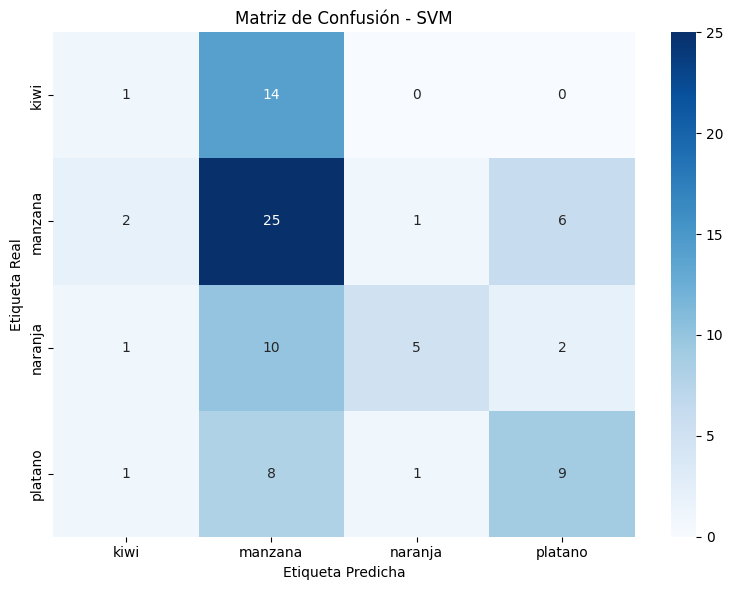

In [22]:
#Generamos la matriz de confusión para el modelo SVM
cm_svm = confusion_matrix(y_test, y_pred_svm)
etiquetas = sorted(np.unique(y_test))

plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues',
            xticklabels=etiquetas, yticklabels=etiquetas)

plt.title("Matriz de Confusión - SVM")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta Real")
plt.tight_layout()
plt.show()

# Apartado 4:
### D) Evalúa el rendimiento del clasificador Naive Bayes, usando métricas y funciones de la biblioteca Scikit-Learn.
- En este último apartado entrenaremos y evaluaremos el segundo clasificador, Naive Bayes, siguiendo el mismo proceso que con SVM.
- Usaremos este modelo como comparativa a SVM.

In [23]:
X = df_caracteristicas[['media_intensidad', 'desviacion_intensidad', 'mediana_intensidad']]
y = df_caracteristicas['clase']

#En este caso, el mínimo 'test_size' para que nos detecte a los Kiwis es 0.4
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

nb = GaussianNB()
nb.fit(X_train, y_train)

y_pred_nb = nb.predict(X_test)

print("=== Clasificador Naive Bayes ===")
print("Accuracy:", accuracy_score(y_test, y_pred_nb))
print(classification_report(y_test, y_pred_nb))

=== Clasificador Naive Bayes ===
Accuracy: 0.3508771929824561
              precision    recall  f1-score   support

        kiwi       0.33      0.10      0.15        10
     manzana       0.36      0.25      0.29        20
     naranja       0.40      0.20      0.27        10
     platano       0.34      0.71      0.46        17

    accuracy                           0.35        57
   macro avg       0.36      0.31      0.29        57
weighted avg       0.36      0.35      0.31        57



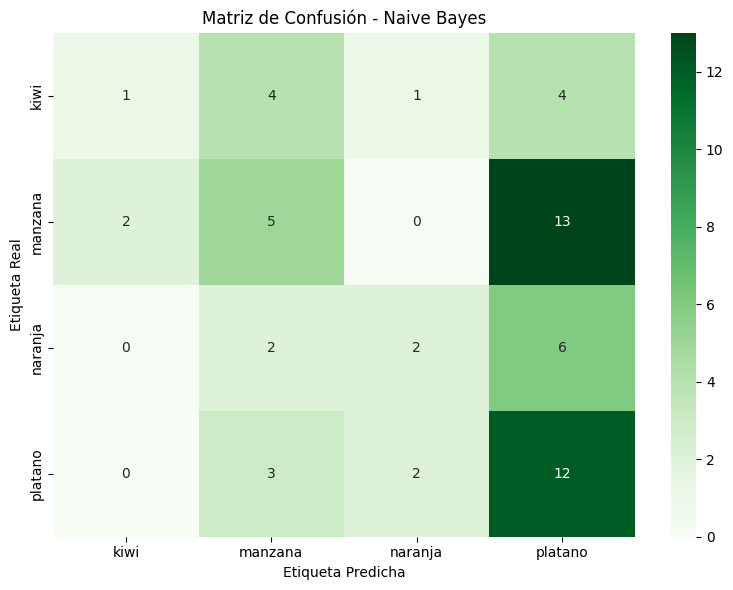

In [24]:
cm_nb = confusion_matrix(y_test, y_pred_nb)
etiquetas = sorted(np.unique(y_test))

plt.figure(figsize=(8, 6))
sns.heatmap(cm_nb, annot=True, fmt='d', cmap='Greens',
            xticklabels=etiquetas, yticklabels=etiquetas)
plt.title("Matriz de Confusión - Naive Bayes")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta Real")
plt.tight_layout()
plt.show()